In [3]:
# laod the pred boxes of each model
import json
import os
import numpy as np

# load the ultralytics models pred boxes
ultralytics_models_pred_boxes_saveing_path = os.path.join("/home/etaylor/code_projects/thesis/data/models_scores", "ultralytics_models_pred_boxes_result_22_05_2024.json")
detectron2_models_pred_boxes_saveing_path = os.path.join("/home/etaylor/code_projects/thesis/data/models_scores", "detectron2_models_pred_boxes_result_22_05_2024.json")

with open(ultralytics_models_pred_boxes_saveing_path, "r") as f:
    ultralytics_models_pred_boxes = json.load(f)
    
with open(detectron2_models_pred_boxes_saveing_path, "r") as f:
    detectron2_models_pred_boxes = json.load(f)

In [4]:
from src.segmentation.evaluation.detectron2_evaluator import Detectron2Evaluator
import os

# varaiables
dataset_path = "/home/etaylor/code_projects/thesis/segments/etaylor_cannabis_patches_test_26-04-2024_15-44-44"
images_dir_path = os.path.join(dataset_path, "v0.1")
coco_annotations_path = os.path.join(dataset_path, "annotations", "export_coco-instance_etaylor_cannabis_patches_test_26-04-2024_15-44-44_v0.1.json")
yolo_annotations_dir_path = os.path.join(dataset_path, "annotations", "yolo", "labels", "export_coco-instance_etaylor_cannabis_patches_test_26-04-2024_15-44-44_v0.1")

# get evalutor and get the ground truth boxes
detectron2_evaluator = Detectron2Evaluator(num_classes=3,coco_annotations_file_path=coco_annotations_path)
dataset_gt_boxes = detectron2_evaluator.get_annotations_for_dataset(images_directory=images_dir_path)

In [5]:
all_models_pred_boxes = {**ultralytics_models_pred_boxes, **detectron2_models_pred_boxes}

In [6]:
models_eval_results = {}
for model_name, pred_boxes in all_models_pred_boxes.items():
    print(f"evaluating model: {model_name}")
    eval_results = detectron2_evaluator.evaluate_dataset(dataset_pred_boxes_dict=pred_boxes,
                                                            dataset_gt_boxes_dict=dataset_gt_boxes,
                                                            single_class=False)
    models_eval_results[model_name] = eval_results

evaluating model: rtdetr_x
evaluating model: yolov5xu
evaluating model: yolov8x
evaluating model: yolov9c
evaluating model: mask_rcnn_R_50_FPN_3x
evaluating model: mask_rcnn_X_101_32x8d_FPN_3x
evaluating model: faster_rcnn_R_50_C4_1x
evaluating model: faster_rcnn_R_50_DC5_1x


In [7]:
sample_eval_results = models_eval_results["faster_rcnn_R_50_C4_1x"]
image_results = sample_eval_results["image_results"]

In [8]:
def find_underperforming_patches_all_images(image_results, class_id=2, misclass_id=3, threshold=0.5):
    all_underperforming_patches = {}
    # Iterate through each image result
    for image_key, image_data in image_results.items():
        underperforming_patches = []
        # Iterate through each patch result in the image
        for patch_key, patch_data in image_data['patch_results'].items():
            # Access the normalized confusion matrix
            norm_conf_matrix = patch_data['normalized_confusion_matrix']
            # Check if the value at the specific index exceeds the threshold
            if norm_conf_matrix[class_id, misclass_id] > threshold:
                underperforming_patches.append(patch_key)
        
        if underperforming_patches:
            all_underperforming_patches[image_key] = underperforming_patches

    return all_underperforming_patches


Predictions


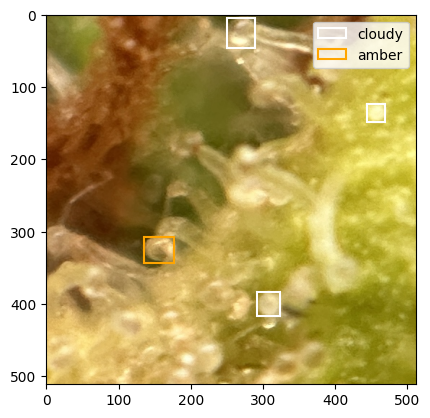

Ground truth


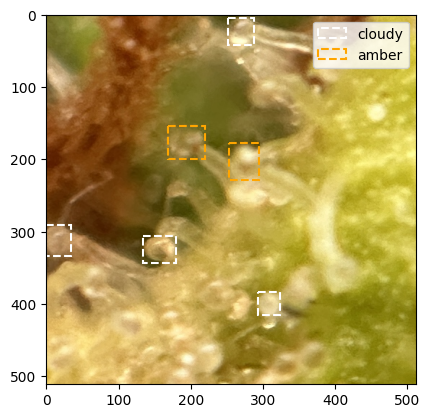

Confusion matrix


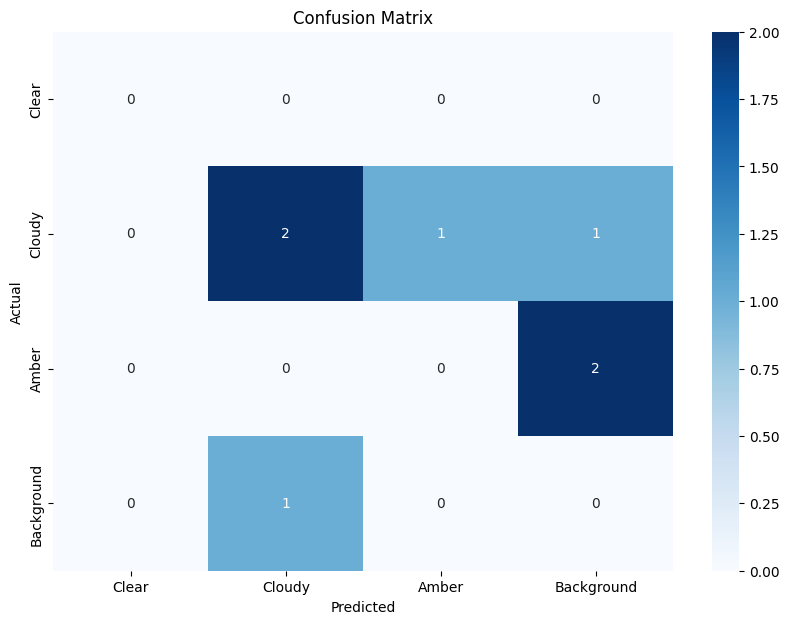

In [9]:
images_path = "/home/etaylor/code_projects/thesis/segments/etaylor_cannabis_patches_test_26-04-2024_15-44-44/v0.1"

image_path = os.path.join(images_path, "IMG_2285_p2.png")
pred_boxes = detectron2_models_pred_boxes["faster_rcnn_R_50_C4_1x"]['IMG_2285']['IMG_2285_p2.png']
gt_boxes = dataset_gt_boxes['IMG_2285']['IMG_2285_p2.png']
cm = sample_eval_results['image_results']['IMG_2285']['patch_results']['IMG_2285_p2.png']['confusion_matrix']

print("Predictions")
detectron2_evaluator.plot_boxes(image_path, pred_boxes, is_ground_truth=False)

print("Ground truth")
detectron2_evaluator.plot_boxes(image_path, gt_boxes, is_ground_truth=True)

print("Confusion matrix")
detectron2_evaluator.plot_confusion_matrix(cm)

In [10]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from PIL import Image


def analyze_patch(image_patch_filename, images_path, pred_boxes_dict, gt_boxes_dict, eval_results_dict, model_name, class_names=['Clear', 'Cloudy', 'Amber']):
    """
    Analyze a specific image patch by plotting the predictions, ground truth, and confusion matrix.

    Args:
        image_patch_filename (str): The filename of the image patch, e.g., 'IMG_2285_p2.png'.
        images_path (str): The path to the directory containing the images.
        pred_boxes_dict (dict): The dictionary containing the predicted bounding boxes.
        gt_boxes_dict (dict): The dictionary containing the ground truth bounding boxes.
        eval_results_dict (dict): The dictionary containing the evaluation results, including the confusion matrix.
        model_name (str): The name of the model used for predictions.
        class_names (list): List of class names for the confusion matrix plot.
    """
    # Extract the base image name from the patch filename
    image_base_name = image_patch_filename.split('_p')[0]

    # Construct the full image path
    image_path = os.path.join(images_path, image_patch_filename)

    # Extract the relevant information
    pred_boxes = pred_boxes_dict[model_name][image_base_name][image_patch_filename]
    gt_boxes = gt_boxes_dict[image_base_name][image_patch_filename]
    cm = eval_results_dict['image_results'][image_base_name]['patch_results'][image_patch_filename]['confusion_matrix']

    # Create the figure and subplots
    fig, axs = plt.subplots(1, 3, figsize=(20, 7))
    fig.suptitle(f'Analysis of {image_patch_filename}', fontsize=16)

    # Plot the predictions
    ax = axs[0]
    image = Image.open(image_path)
    ax.imshow(image)
    plot_boxes(image, pred_boxes, is_ground_truth=False, ax=ax)
    ax.set_title('Predictions')

    # Plot the ground truth
    ax = axs[1]
    ax.imshow(image)
    plot_boxes(image, gt_boxes, is_ground_truth=True, ax=ax)
    ax.set_title('Ground Truth')

    # Plot the confusion matrix
    ax = axs[2]
    plot_confusion_matrix(cm, class_names=class_names, ax=ax)
    ax.set_title('Confusion Matrix')

    plt.show()

# Modify plot_boxes and plot_confusion_matrix to accept an axis (ax) argument
def plot_boxes(image, boxes, class_label=None, is_ground_truth=True, ax=None):
    """
    Plots bounding boxes on the image for a specific class label.

    Args:
        image (PIL Image or str): The image on which to plot, or the path to the image.
        boxes (list): List of dictionaries containing bounding boxes with 'bbox' and 'class_id'.
        class_label (int, optional): Specific class label to plot. If None, plots all classes.
        is_ground_truth (bool): Flag indicating if the boxes are ground truth. Defaults to True.
        ax (matplotlib.axes.Axes, optional): Matplotlib axis to plot on. If None, creates a new figure.
    """
    # If image is the path to the image, read it
    if isinstance(image, str):
        image = Image.open(image)

    if ax is None:
        fig, ax = plt.subplots(1)
        ax.imshow(image)

    # Set class labels (assuming 3 classes as described: clear, cloudy, amber)
    class_labels = {0: 'clear', 1: 'cloudy', 2: 'amber'}

    # Select appropriate colors
    colors = {0: 'grey', 1: 'white', 2: 'orange'}
    linestyle = 'dashed' if is_ground_truth else 'solid'

    # Plot boxes
    for box in boxes:
        if class_label is None or box['class_id'] == class_label:
            x_min, y_min, x_max, y_max = box['bbox']
            cls_id = box['class_id']
            rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1.5, edgecolor=colors[cls_id], facecolor='none', linestyle=linestyle, label=class_labels[cls_id])
            ax.add_patch(rect)

    # Set legend
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))  # Removing duplicates in legend
    ax.legend(by_label.values(), by_label.keys())

def plot_confusion_matrix(cm, class_names=['Clear', 'Cloudy', 'Amber'], ax=None):
    """Plot the confusion matrix."""
    if ax is None:
        fig, ax = plt.subplots(1)

    sns.heatmap(cm, annot=True, fmt="0.2f" if cm.dtype == np.float32 else "d", cmap="Blues", xticklabels=class_names + ['Background'], yticklabels=class_names + ['Background'], ax=ax)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_title('Confusion Matrix')


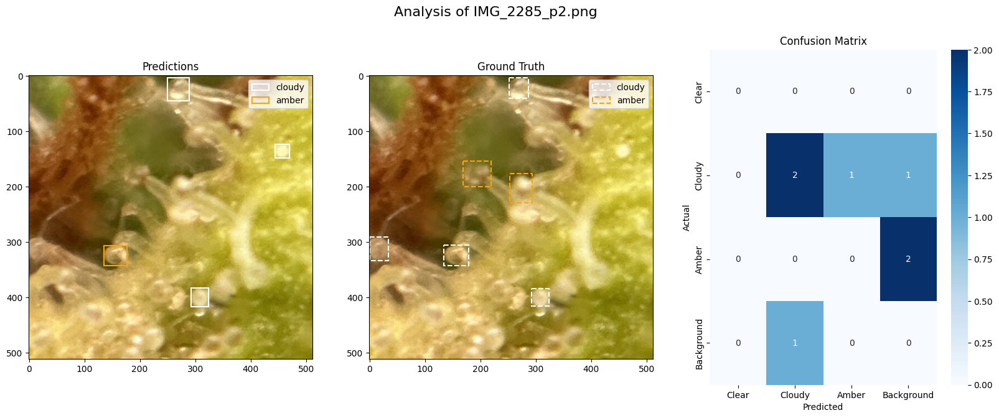

In [11]:
# Example usage
image_patch_filename = "IMG_2285_p2.png"
images_path = "/home/etaylor/code_projects/thesis/segments/etaylor_cannabis_patches_test_26-04-2024_15-44-44/v0.1"
model_name = "faster_rcnn_R_50_C4_1x"

analyze_patch(image_patch_filename, images_path, detectron2_models_pred_boxes, dataset_gt_boxes, sample_eval_results, model_name)

In [12]:
images_path = "/home/etaylor/code_projects/thesis/segments/etaylor_cannabis_patches_test_26-04-2024_15-44-44/v0.1"
model_name = "faster_rcnn_R_50_C4_1x"

Underperforming patches across all images: {'IMG_1096': ['IMG_1096_p0.png', 'IMG_1096_p12.png'], 'IMG_1093': ['IMG_1093_p0.png', 'IMG_1093_p10.png', 'IMG_1093_p11.png', 'IMG_1093_p7.png'], 'IMG_2285': ['IMG_2285_p2.png'], 'IMG_1079': ['IMG_1079_p0.png', 'IMG_1079_p5.png']}


Amber class bad detection patches across images:
Analyzing patch: IMG_1096_p0.png


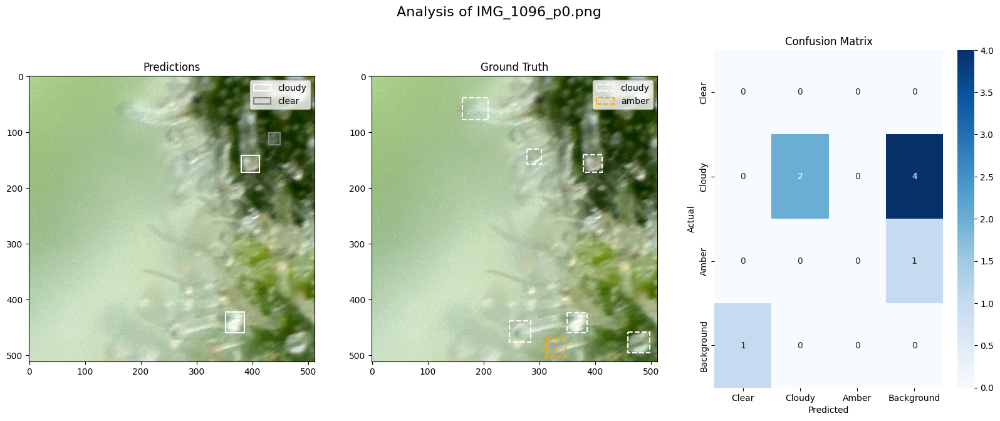

Analyzing patch: IMG_1096_p12.png


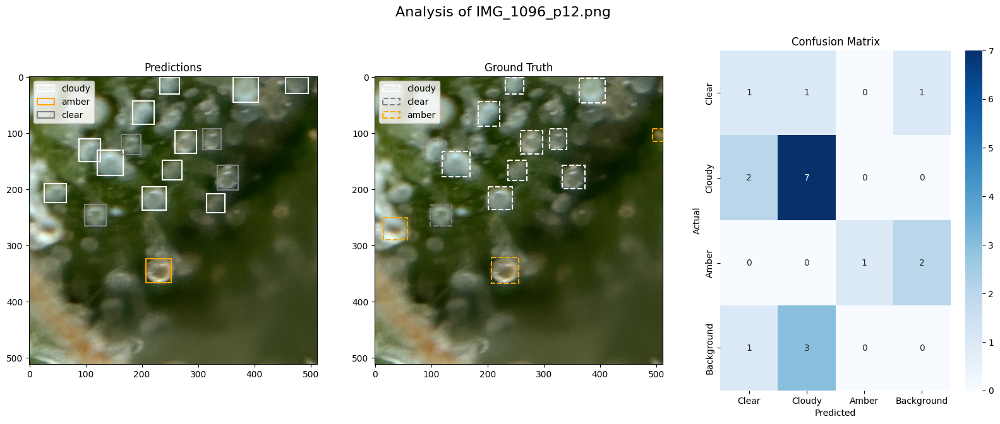

Analyzing patch: IMG_1093_p0.png


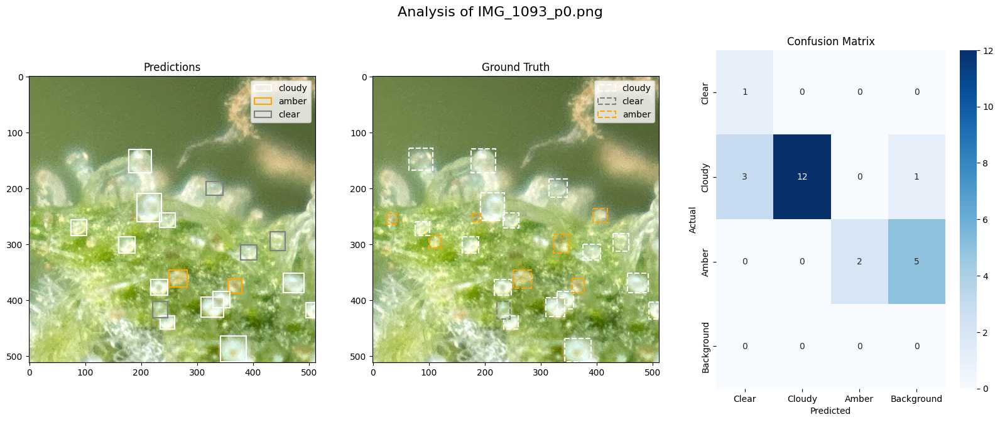

Analyzing patch: IMG_1093_p10.png


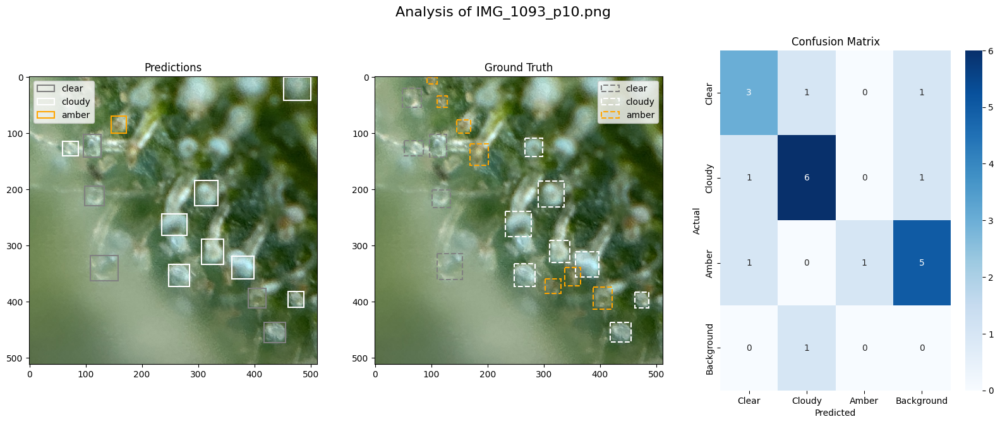

Analyzing patch: IMG_1093_p11.png


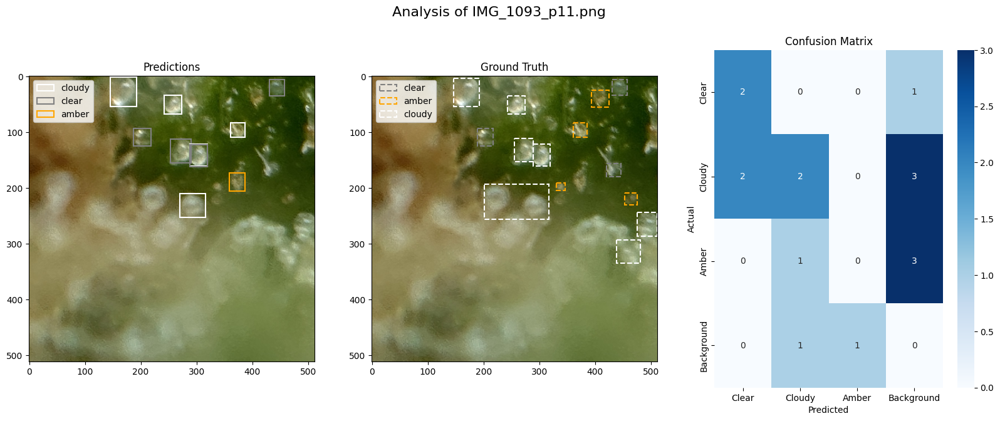

Analyzing patch: IMG_1093_p7.png


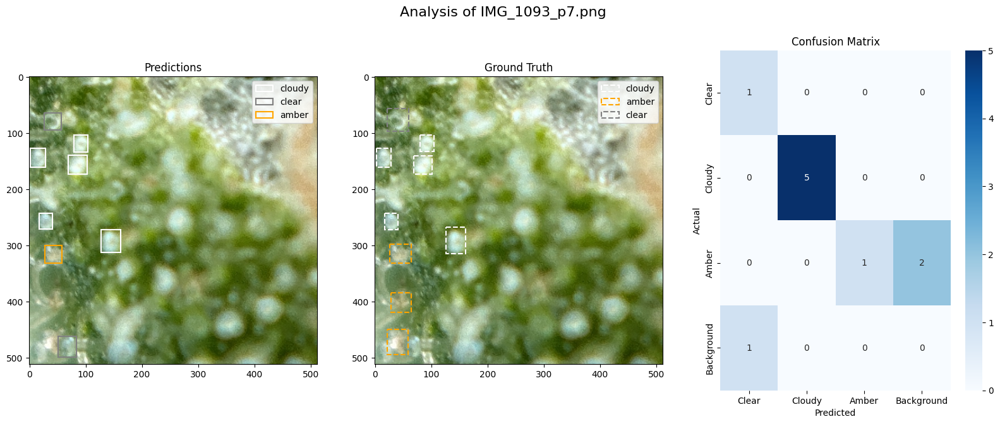

Analyzing patch: IMG_2285_p2.png


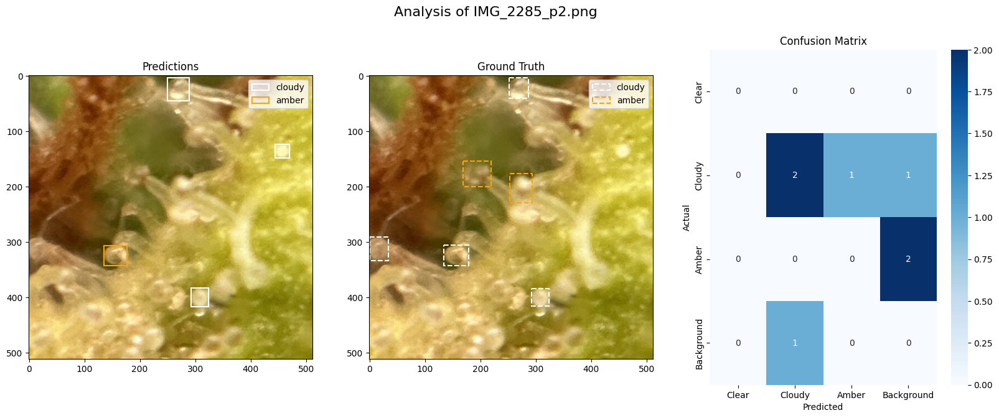

Analyzing patch: IMG_1079_p0.png


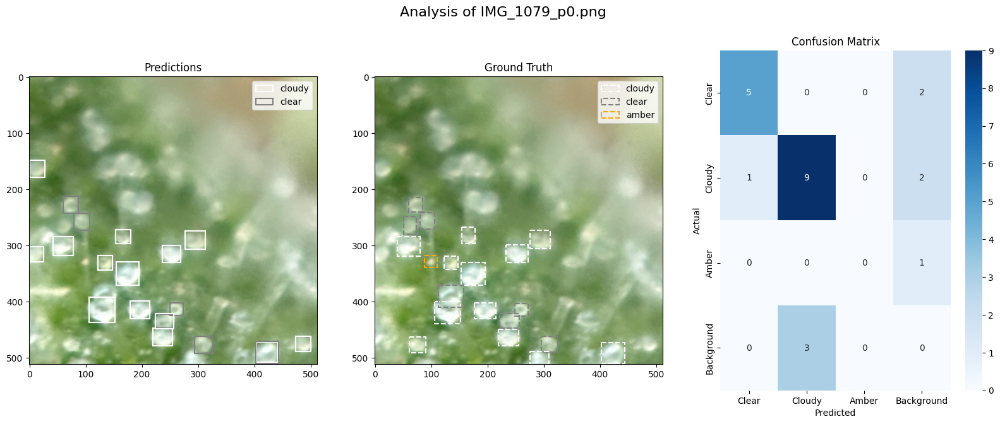

Analyzing patch: IMG_1079_p5.png


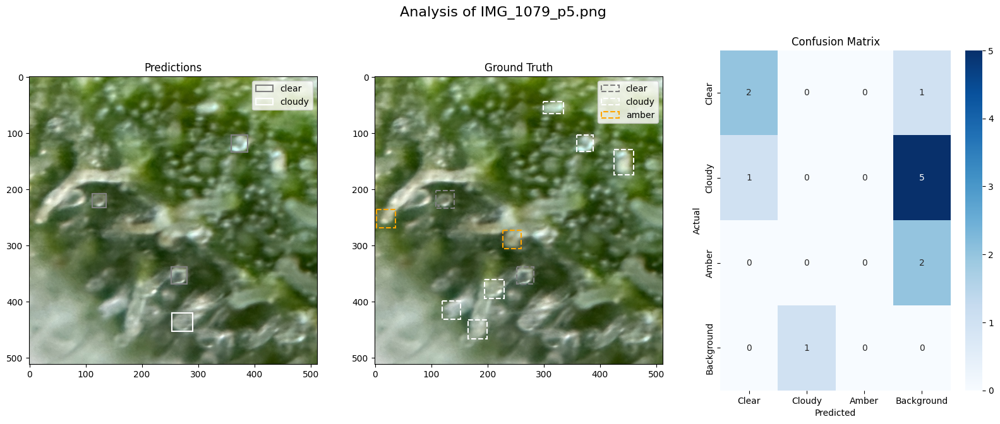

In [14]:
amber_bad_patches = find_underperforming_patches_all_images(image_results, class_id=2, misclass_id=3, threshold=0.5)
print("Amber class bad detection patches across images:")
for image_base_name, patches_images in amber_bad_patches.items():
    for patch in patches_images:
        print(f"Analyzing patch: {patch}")
        analyze_patch(patch, images_path, detectron2_models_pred_boxes, dataset_gt_boxes, sample_eval_results, model_name)

Clear class bad detection patches across images:
Analyzing patch: IMG_2198_p7.png


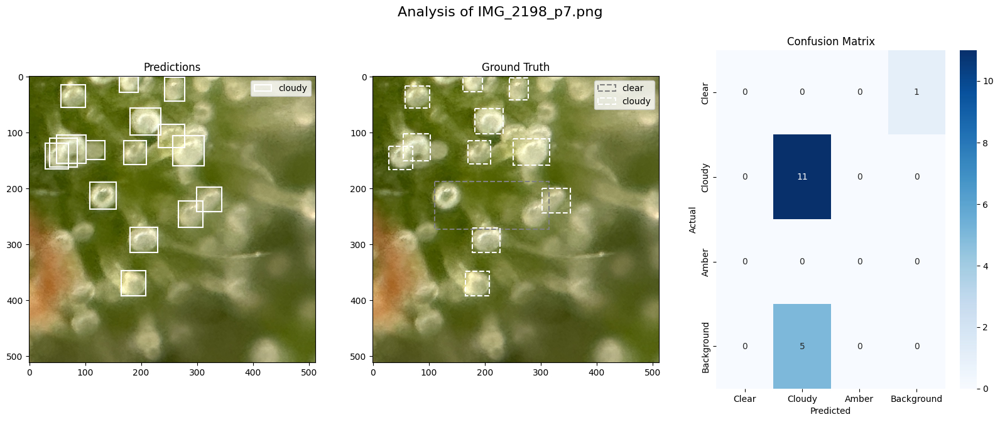

Analyzing patch: IMG_2271_p3.png


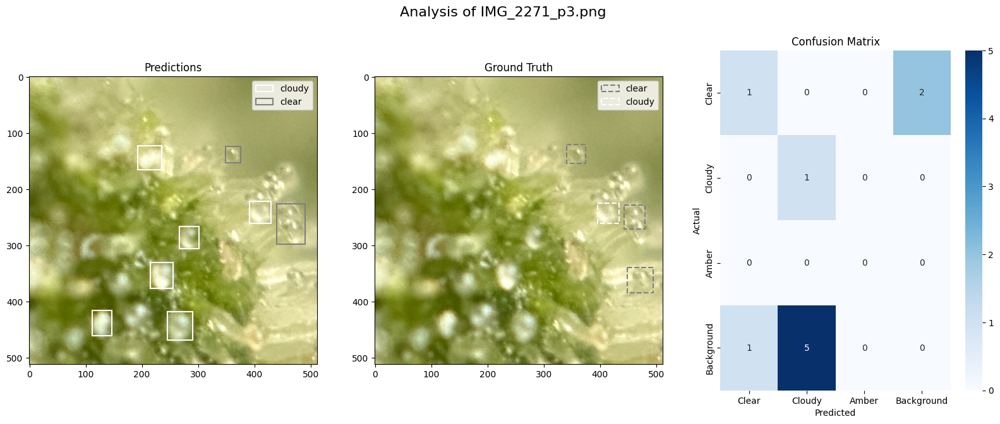

Analyzing patch: IMG_1093_p2.png


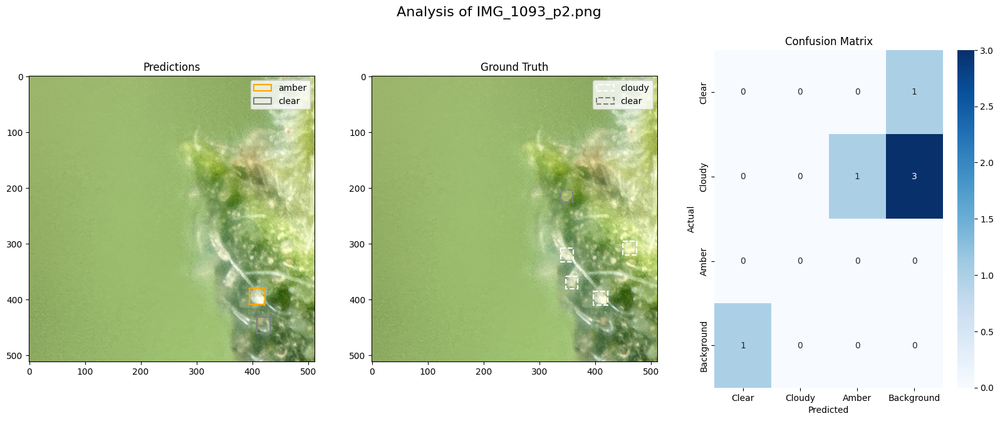

Analyzing patch: IMG_1093_p3.png


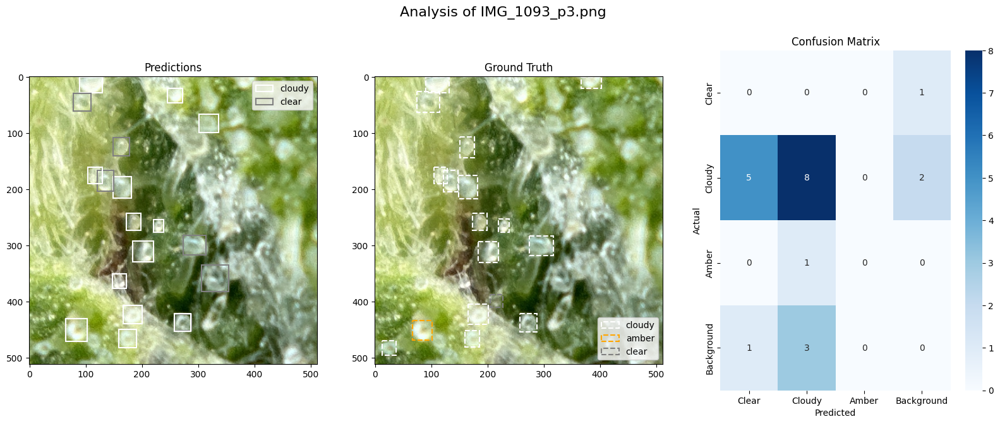

Analyzing patch: IMG_1093_p9.png


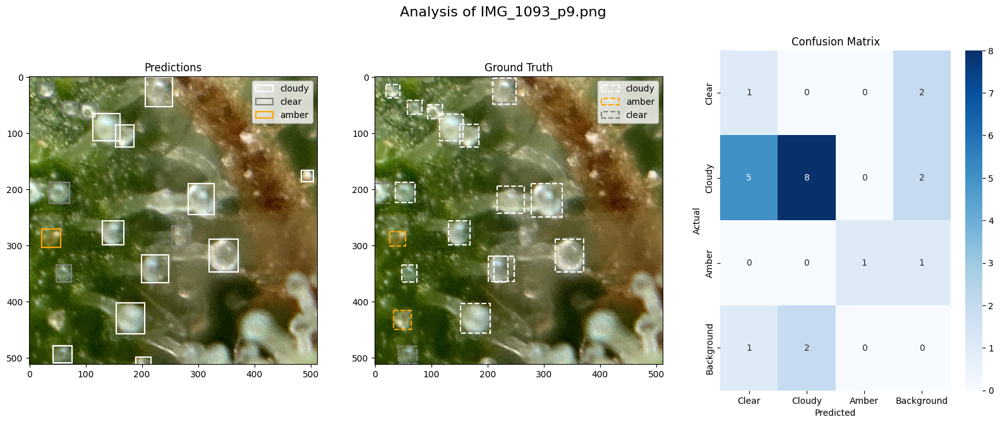

Analyzing patch: IMG_0058_p5.png


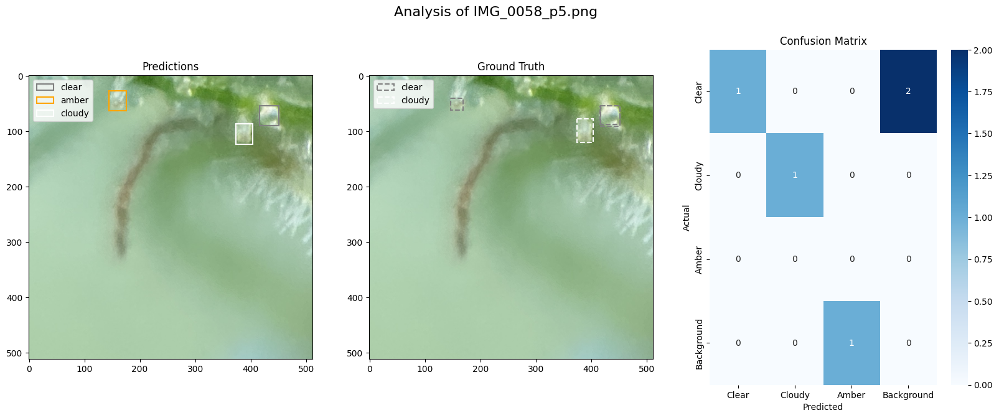

Analyzing patch: IMG_2285_p1.png


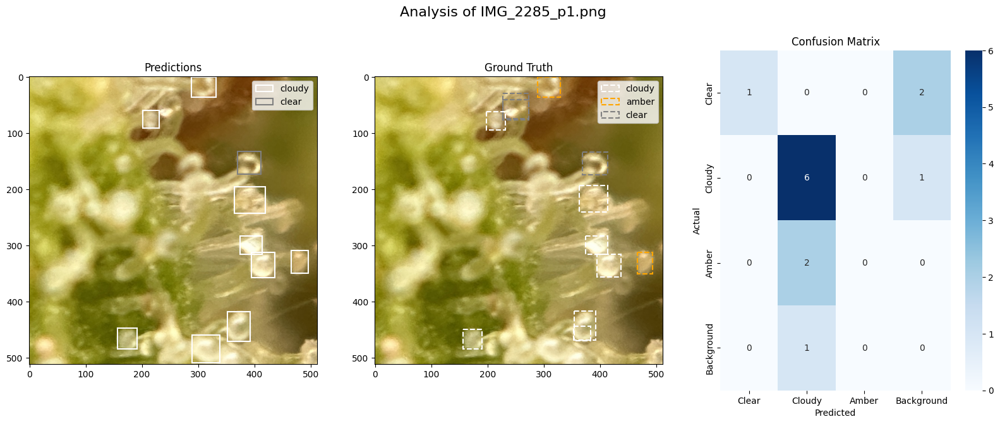

Analyzing patch: IMG_2285_p5.png


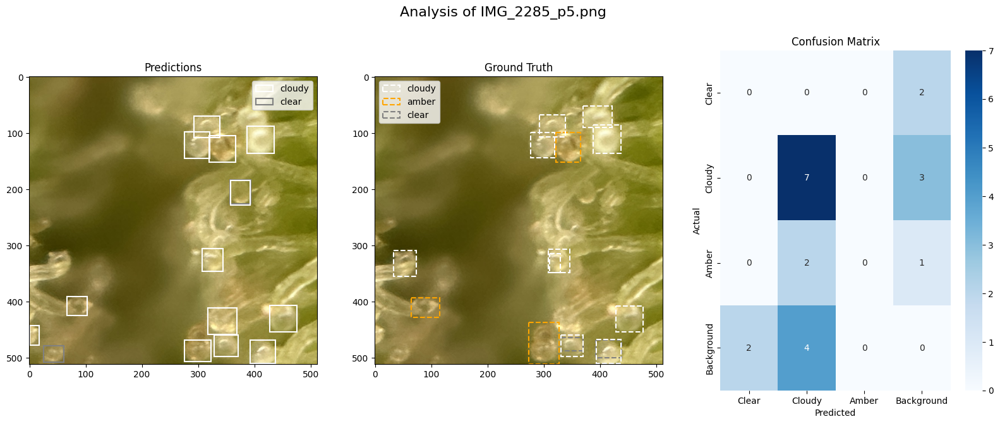

In [15]:
amber_bad_patches = find_underperforming_patches_all_images(image_results, class_id=0, misclass_id=3, threshold=0.5)
print("Clear class bad detection patches across images:")
for image_base_name, patches_images in amber_bad_patches.items():
    for patch in patches_images:
        print(f"Analyzing patch: {patch}")
        analyze_patch(patch, images_path, detectron2_models_pred_boxes, dataset_gt_boxes, sample_eval_results, model_name)

Cloudy class bad detection patches across images:
Analyzing patch: IMG_1096_p0.png


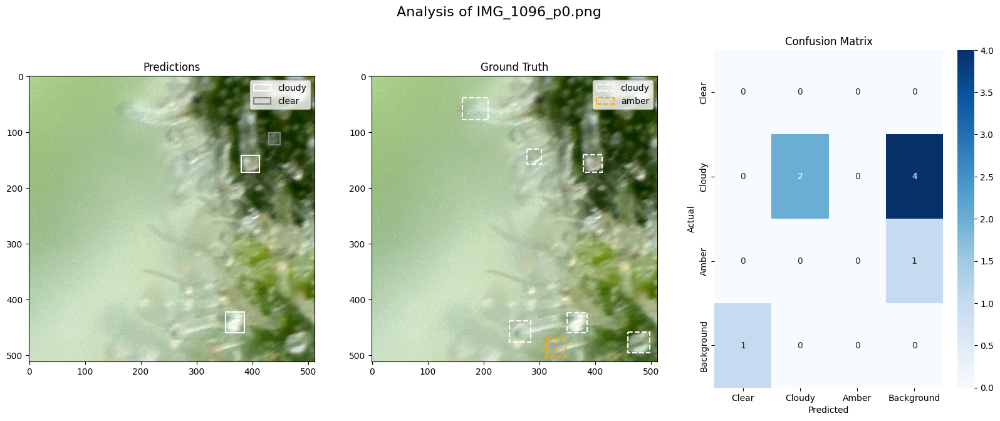

Analyzing patch: IMG_1096_p6.png


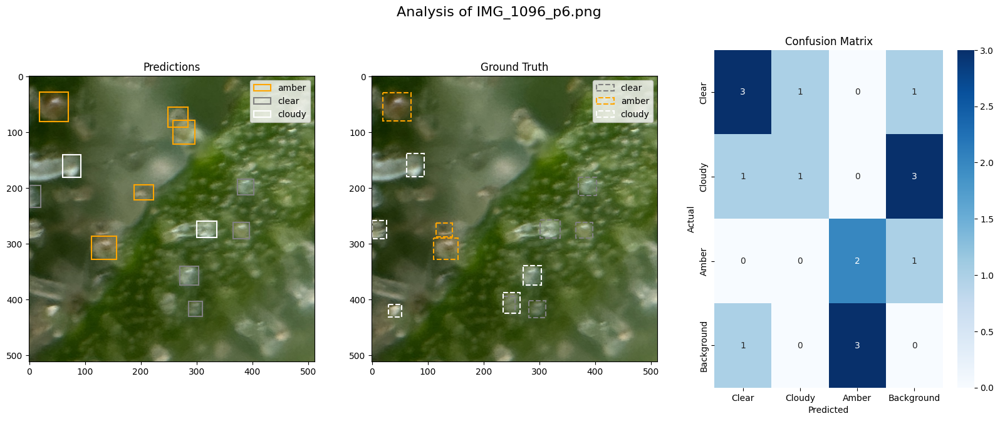

Analyzing patch: IMG_2271_p4.png


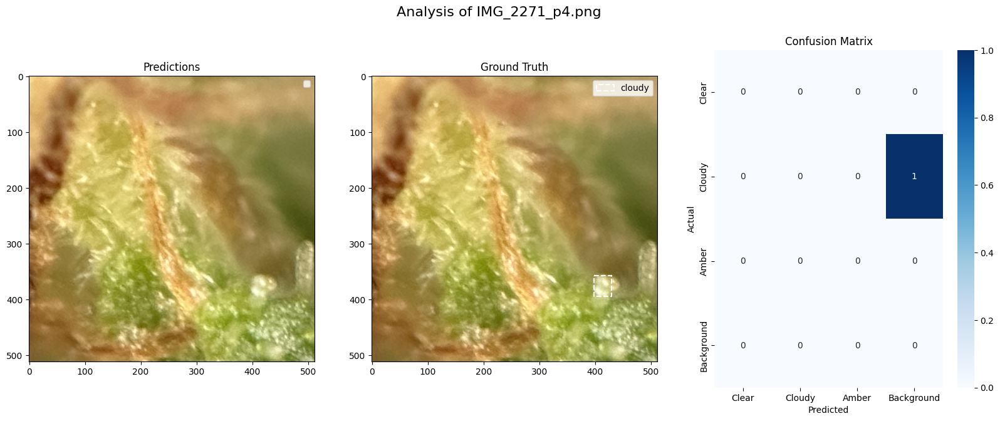

Analyzing patch: IMG_1093_p2.png


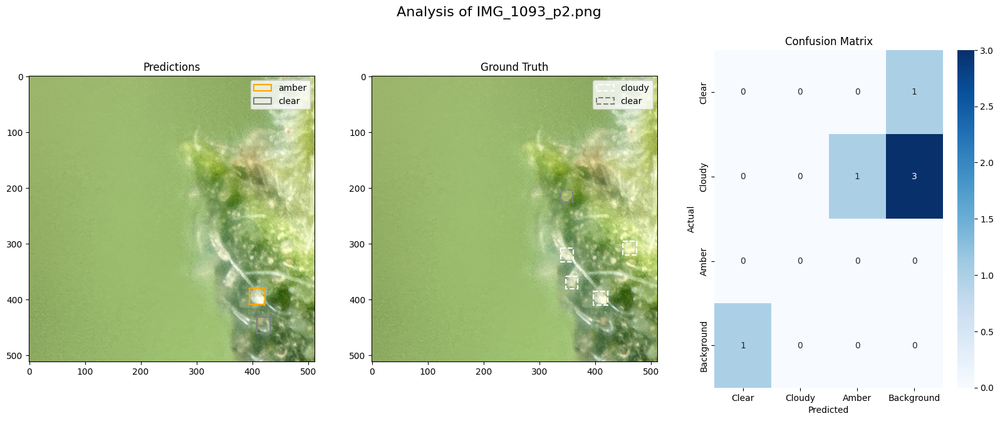

Analyzing patch: IMG_1079_p5.png


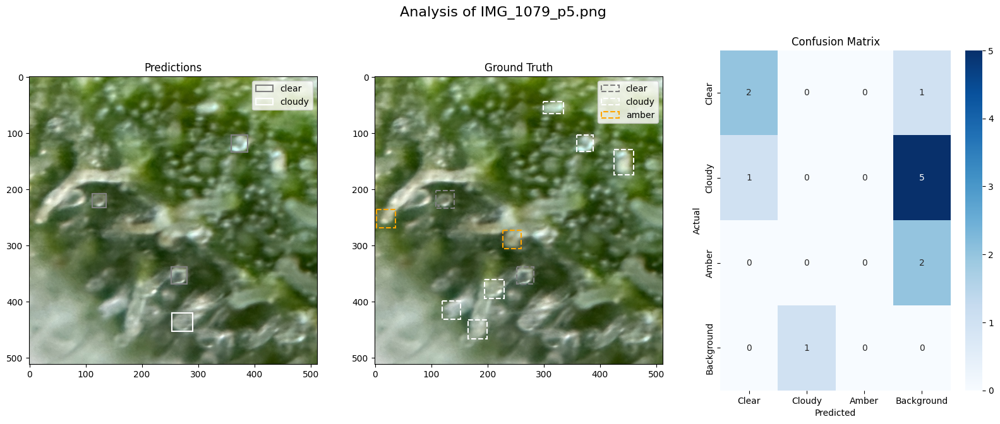

In [16]:
amber_bad_patches = find_underperforming_patches_all_images(image_results, class_id=1, misclass_id=3, threshold=0.5)
print("Cloudy class bad detection patches across images:")
for image_base_name, patches_images in amber_bad_patches.items():
    for patch in patches_images:
        print(f"Analyzing patch: {patch}")
        analyze_patch(patch, images_path, detectron2_models_pred_boxes, dataset_gt_boxes, sample_eval_results, model_name)